## Install

In [ ]:
!rm -r transformers
!git clone -b add_layoutreader https://github.com/nielsrogge/transformers.git
!cd transformers
!pip install -q ./transformers

rm: cannot remove 'transformers': No such file or directory
Cloning into 'transformers'...
remote: Enumerating objects: 236959, done.
remote: Counting objects: 100% (26712/26712), done.
remote: Compressing objects: 100% (1852/1852), done.
remote: Total 236959 (delta 26236), reused 24860 (delta 24860), pack-reused 210247
Receiving objects: 100% (236959/236959), 214.54 MiB | 8.83 MiB/s, done.
Resolving deltas: 100% (169816/169816), done.
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 21.8 MB/s eta 0:00:00


In [ ]:
!pip install python-doctr
!pip install "python-doctr[tf]"
!pip install "python-doctr[torch]"

  Using cached tf2onnx-1.16.1-py3-none-any.whl (455 kB)
  Using cached onnx-1.15.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (15.7 MB)
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 42.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 10.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196.0 MB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.0/166.0 MB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━

## import

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
import copy
from PIL import Image, ImageDraw
import torch
import cv2
from google.colab.patches import cv2_imshow

In [ ]:
from huggingface_hub import hf_hub_download
from doctr.io import DocumentFile
from doctr.io.elements import Block, Document, KIEDocument, KIEPage, Line, Page, Prediction, Word
from doctr.models import ocr_predictor, detection_predictor, builder
# from doctr.utils.geometry import resolve_enclosing_bbox
from __future__ import print_function
from google.colab import files

In [ ]:
from transformers import LayoutReaderForSeq2SeqDecoding
from transformers import AutoTokenizer
from transformers import LayoutLMv3ForTokenClassification

## utils


In [ ]:
def makeDir(name):
    if os.path.exists(name) is False:
        os.mkdir(name)
    else:
        for filename in os.listdir(name):
            if os.path.isfile(os.path.join(name, filename)):
                os.remove(os.path.join(name, filename))

In [ ]:
def load_images_from_folder(folder):
    image_paths = []
    for filename in os.listdir(folder):
      if filename != '.ipynb_checkpoints':
        image_paths.append(os.path.join(folder, filename))
    return image_paths

In [ ]:
def images_to_pdf(directory):
    pil_images = []
    convert_pil_images = []

    for filename in os.listdir(directory):
        if filename != ".ipynb_checkpoints" and filename != "result.pdf":
            pil_images.append(Image.open(directory + "/" + filename))

    for pil_image in pil_images:
        convert_pil_images.append(pil_image.convert('RGB'))

    image_list = convert_pil_images[1:]

    convert_pil_images[0].save(f"{directory}/result.pdf", save_all = True, append_images = image_list)

## Functions for lines

In [ ]:
def reorder_coordinates(coordinates):
    ordered_coordinates = []
    for polygon_coords in coordinates:
        most_left_coords = polygon_coords[np.argsort(polygon_coords[:, 0])][:2]
        sorted_most_left_coords = most_left_coords[np.argsort(most_left_coords[:, 1])]
        most_left_top = sorted_most_left_coords[0]
        idx = np.where((polygon_coords == most_left_top).all(axis=1))[0][0]

        reordered_coords = np.roll(polygon_coords, -idx, axis=0)
        ordered_coordinates.append(reordered_coords)
    return ordered_coordinates

def sort_by_y_of_first_coord(polygons):
    def get_y_of_first_coord(polygon):
        return min(point[1] for point in polygon)
    sorted_polygons = sorted(polygons, key=get_y_of_first_coord)
    return sorted_polygons

In [ ]:
def get_xy_maxmin(box):
  tl, tr, br, bl = box[0],box[1],box[2],box[3]
  x_min, x_max = min(tl[0],tr[0],br[0],bl[0]), max(tl[0],tr[0],br[0],bl[0])
  y_min, y_max = max(tl[1],tr[1],br[1],bl[1]), min(tl[1],tr[1],br[1],bl[1])
  return x_min, x_max, y_min, y_max

def find_overlaped_y(box_index, boxes):
    overlapping_boxes = []
    box = boxes[box_index]
    tl, tr, br, bl = box[0],box[1],box[2],box[3]
    target_x_min, target_x_max, target_y_min, target_y_max = get_xy_maxmin(box)

    for idx, b in enumerate(boxes):
        if idx != box_index:
            x_min, x_max, y_min, y_max = get_xy_maxmin(b)
            # dist_x = x_min-x_max
            dist_y = y_min - y_max
            # if check_overlapping_y(y_min, y_max,target_y_min ,target_y_max):#(y_min >= target_y_max and y_min <= target_y_min) or (y_max >= target_y_max and y_max <= target_y_min) or (y_max <= target_y_max and y_min >= target_y_min):
            #     overlapping_boxes.append(idx)
            if 2 * check_overlapping_y2(y_min, y_max,target_y_min ,target_y_max, dist_y):#(y_min >= target_y_max and y_min <= target_y_min) or (y_max >= target_y_max and y_max <= target_y_min) or (y_max <= target_y_max and y_min >= target_y_min):
                overlapping_boxes.append(idx)
    return overlapping_boxes

def check_overlapping_y(y1_min, y1_max, y2_min, y2_max):
  if (y1_min >= y2_max and y1_min <= y2_min) or (y1_max >= y2_max and y1_max <= y2_min) or (y1_max <= y2_max and y1_min >= y2_min): return True
  else: return False

def check_overlapping_y2(y1_min, y1_max, y2_min, y2_max, dist_y):
  if (y1_max <= y2_max and y1_min >= y2_min):
    return True
  elif (y1_max >= y2_max and y1_min <= y2_min):
    return True
  elif (y1_min >= y2_max and y1_min <= y2_min and y1_min - y2_max >= dist_y/2):
    return True
  elif(y1_max >= y2_max and y1_max <= y2_min and y2_min - y1_max >= dist_y/2):
    return True
  else: return 0

def check_x_overlap(box1, box2, thr=0.08):
  x1_min, x1_max, _, __ = get_xy_maxmin(box1)
  x2_min, x2_max, _, __ = get_xy_maxmin(box2)
  if max(x1_min, x2_min) <= min(x1_max, x2_max):
        overlap_length = min(x1_max, x2_max) - max(x1_min, x2_min)
  else: overlap_length = 0
  overlap_coof = overlap_length / (x1_max - x1_min)
  if overlap_coof > thr: return False
  else: return True


def choose_lr_boxes(box_index, overlaped_boxes_idx, boxes):
  main_box = boxes[box_index]
  x1_min, x1_max, _, __ = get_xy_maxmin(main_box)
  # lb = None
  # rb = None
  # lb_x_max = None
  # rb_x_min = None
  # lb_idx = None
  # rb_idx = None
  lb, rb, lb_x_max, rb_x_min, lb_idx, rb_idx = [None] * 6
  tl1, tr1,br1, bl1  = main_box[0], main_box[1],main_box[2], main_box[3]
  word_height = bl1[1] - tl1[1]
  # print(f'--- {box_index}')
  for idx in overlaped_boxes_idx:
            box = boxes[idx]
            # print(f'- {idx}')
        # if check_x_overlap(main_box, box):
            x_min, x_max, _, __ = get_xy_maxmin(box)
            tr, br  = box[1],box[2]
            dist_l = distance_between_points(tr, tl1) + distance_between_points(br, bl1)
            tl, tr, br, bl  = box[0],box[1],box[2],box[3]
            dist_r = distance_between_points(tl, tr1) + distance_between_points(bl, br1)
            # print(f"{x_min}, {x1_min}, {3*word_height}, {dist_r}")
            if (x_max < x1_max) and (word_height*2>dist_l) and check_overlapping_y(br[1], tr[1], bl1[1] ,tl1[1]):
                # print(f'/// {idx}')
                # if lb is None or x_max > lb_x_max:
                if lb is None or dist_l < lb_dist:
                    lb = box
                    # lb_x_max = max(lb[0][0],lb[1][0],lb[2][0],lb[3][0])
                    lb_dist = dist_l
                    lb_idx = idx
            # print()
            elif (x_min > x1_min) and (word_height*2>dist_r)  and check_overlapping_y(bl[1], tl[1], br1[1] ,tr1[1]):
                # print(f'/// {idx}')
                # if rb is None or x_min < rb_x_min:
                if rb is None or dist_r < rb_dist:
                    rb = box
                    # rb_x_min = min(rb[0][0],rb[1][0],rb[2][0],rb[3][0])
                    rb_dist = dist_r
                    rb_idx = idx
  return lb, lb_idx, rb, rb_idx

def choose_l_box(box_index, overlaped_boxes_idx, boxes):
  main_box = boxes[box_index]
  x1_min, x1_max, _, __ = get_xy_maxmin(main_box)
  lb = None
  lb_x_max = None
  lb_idx = None
  tl1, bl1  = main_box[0],main_box[3]
  word_height = bl1[1] - tl1[1]
  for idx in overlaped_boxes_idx:
            box = boxes[idx]
            # if check_x_overlap(main_box, box):
            x_min, x_max, _, __ = get_xy_maxmin(box)
            tr, br  = box[1],box[2]
            dist = distance_between_points(tr, tl1) + distance_between_points(br, bl1)
            # print(f'{word_height*100}, {dist} ')
            if (x_max < x1_max) and (word_height*2>dist) and check_overlapping_y(br[1], tr[1], bl1[1] ,tl1[1]):
                if lb is None or dist < lb_dist:
                    lb = box
                    lb_dist = dist
                    lb_idx = idx
  return lb, lb_idx

def choose_r_box(box_index, overlaped_boxes_idx, boxes):
  main_box = boxes[box_index]
  x1_min, x1_max, _, __ = get_xy_maxmin(main_box)
  rb = None
  rb_x_min = None
  rb_idx = None
  tr1, br1  = main_box[1],main_box[2]
  word_height = br1[1] - tr1[1]
  for idx in overlaped_boxes_idx:
            box = boxes[idx]
        # if check_x_overlap(main_box, box):
            x_min, x_max, _, __ = get_xy_maxmin(box)
            tl, bl  = box[0],box[3]
            dist = distance_between_points(tl, tr1) + distance_between_points(bl, br1)
            if( x_min > x1_min) and (word_height*2>dist) and check_overlapping_y(bl[1], tl[1], br1[1] ,tr1[1]):
                if rb is None or dist < rb_dist:
                    rb = box
                    rb_dist = dist
                    rb_idx = idx
  return rb, rb_idx

def delete_elements_by_indexes(lst, indxs):
    indxs.sort(reverse=True)
    for index in indxs:
        del lst[index]

def distance_between_points(point1, point2):
    x1, y1 = point1
    x2, y2 = point2
    distance = np.sqrt((x2 - x1)**2 + (y2 - y1)**2)
    return distance

In [ ]:
def draw_image_lines(lines, dr):
  for line in lines:
    first_word = line[0]
    dr.line((first_word[0][0], first_word[0][1], first_word[3][0], first_word[3][1]), fill='red', width=2)
    tr_point = first_word[1]
    br_point = first_word[2]
    last_word = line[-1]
    dr.line((last_word[1][0], last_word[1][1], last_word[2][0], last_word[2][1]), fill='red', width=2)
    for points in line:
          dr.line((points[0][0], points[0][1], points[1][0], points[1][1]), fill='red', width=2)
          dr.line((points[2][0], points[2][1], points[3][0], points[3][1]), fill='red', width=2)
          dr.line((points[0][0], points[0][1], tr_point[0], tr_point[1]), fill='red', width=2)
          dr.line((points[3][0], points[3][1], br_point[0], br_point[1]), fill='red', width=2)
          tr_point = points[1]
          br_point = points[2]

In [ ]:
def group_words_into_lines(polygons):
  j = -1
  lines = []
  line_indexes = []

  while polygons:
    # print(j)
    j-=1
    top_box = polygons[0]
    tb_overl_idx = find_overlaped_y(0, polygons)
    first_l, idx_l, first_r, idx_r = choose_lr_boxes(0, tb_overl_idx, polygons)
    # print(first_l)
    line = [top_box]
    line_indexes = [0]

    while first_l is not None:
      line.insert(0, first_l) #append(first_l)
      line_indexes.append(idx_l)
      l_overl_idx = find_overlaped_y(idx_l, polygons)
      first_l, idx_l = choose_l_box(idx_l, l_overl_idx, polygons)

    while first_r is not None:
      line.append(first_r)
      line_indexes.append(idx_r)
      r_overl_idx = find_overlaped_y(idx_r, polygons)
      first_r, idx_r = choose_r_box(idx_r, r_overl_idx, polygons)
    lines.append(line)

    # lines_indexes.append(line_indexes)
    delete_elements_by_indexes(polygons, line_indexes)
  return lines

In [ ]:
def get_average_line_height(line):

  sum_height = 0
  for word in line:
    sum_height += abs(word[0][1] - word[3][1])
  line_height = sum_height/len(line)

  return line_height


def append_to_block(line, text_blocks):

  first_word = line[0]
  line_height = get_average_line_height(line)

  for block in text_blocks:

      block_line = block[0]
      aver_h = get_average_line_height(block_line)
      if line_height/aver_h < 0.5 or line_height/aver_h > 1.5: continue

      first_word_in_block_line = block_line[0]

      if abs(first_word_in_block_line[0][1] - first_word[3][1]) < line_height * 0.7 and abs(first_word_in_block_line[0][0] - first_word[3][0]) < line_height * 4:

        block.insert(0, line)
        return

      block_line = block[-1]
      first_word_in_block_line = block_line[0]

      if abs(first_word_in_block_line[3][1] - first_word[0][1]) < line_height * 0.7 and abs(first_word_in_block_line[3][0] - first_word[0][0]) < line_height * 4:

        block.append(line)
        return

  block = [line]
  text_blocks.append(block)


In [ ]:
import random

def get_random_color():

    red = random.randint(0, 255)
    green = random.randint(0, 255)
    blue = random.randint(0, 255)

    return red, green, blue


def draw_image_lines(lines, dr, color='red'):

  for line in lines:
    first_word = line[0]
    dr.line((first_word[0][0], first_word[0][1], first_word[3][0], first_word[3][1]), fill=color, width=2)
    tr_point = first_word[1]
    br_point = first_word[2]
    last_word = line[-1]
    dr.line((last_word[1][0], last_word[1][1], last_word[2][0], last_word[2][1]), fill=color, width=2)
    for points in line:
          dr.line((points[0][0], points[0][1], points[1][0], points[1][1]), fill=color, width=2)
          dr.line((points[2][0], points[2][1], points[3][0], points[3][1]), fill=color, width=2)
          dr.line((points[0][0], points[0][1], tr_point[0], tr_point[1]), fill=color, width=2)
          dr.line((points[3][0], points[3][1], br_point[0], br_point[1]), fill=color, width=2)
          tr_point = points[1]
          br_point = points[2]

## Function for blocks

In [ ]:
def calculate_overlap_area(block1, block2):
    # Calculate the overlap area between two blocks
    x_overlap = max(0, min(block1[2], block2[2]) - max(block1[0], block2[0]))
    y_overlap = max(0, min(block1[3], block2[3]) - max(block1[1], block2[1]))
    overlap_area = x_overlap * y_overlap
    return overlap_area

def filter_blocks_th(blocks, threshold=0.9):
    # Filter out blocks that are almost entirely inside other blocks
    blocks_to_remove = set()
    for i, block1 in enumerate(blocks):
        for j, block2 in enumerate(blocks):
            if i != j and j not in blocks_to_remove:
                overlap_area = calculate_overlap_area(block1, block2)
                area1 = (block1[2] - block1[0]) * (block1[3] - block1[1])
                if overlap_area / area1 > threshold:
                    blocks_to_remove.add(i)
                    break
    filtered_blocks = [block for i, block in enumerate(blocks) if i not in blocks_to_remove]
    return filtered_blocks

In [ ]:
def is_inside(box1, box2):
    x1, y1, x2, y2 = box1
    xx1, yy1, xx2, yy2 = box2
    return x1 > xx1 and y1 > yy1 and x2 < xx2 and y2 <= yy2

def filter_boxes(boxes):
    filtered_boxes = []
    for i, box1 in enumerate(boxes):
        is_inside_another = False
        for j, box2 in enumerate(boxes):
            if i != j and is_inside(box1, box2):
                is_inside_another = True
                break
        if not is_inside_another:
            filtered_boxes.append(box1)
    return filtered_boxes

In [ ]:
def create_heatmap(bounding_boxes_list):
     heatmap = np.zeros(shape=(image.size[1], image.size[0]))
     for bounding_box in bounding_boxes_list:
          heatmap[int(bounding_box[1]):int(bounding_box[3]), int(bounding_box[0]):int(bounding_box[2])] += bounding_box[4]

     return heatmap

## Functions for ordering

In [ ]:
def normalize_box(box, width, height):
    return [
        int(1000 * (box[0] / width)),
        int(1000 * (box[1] / height)),
        int(1000 * (box[2] / width)),
        int(1000 * (box[3] / height)),
    ]
def apply_doctr(image_path):
  document = DocumentFile.from_images(image_path)
  result = model_d(document)
  return result

def get_words(result, image_path):
  image = Image.open(image_path)
  page = result.pages[0]
  blocks = page.blocks
  dims = page.dimensions
  # result.show()

  doctr_coord = []
  words = []
  normalized_boxes = []

  for b in blocks:
    for line in b.lines:
      for word in line.words:
        coord = word.geometry
        x1, y1, x2, y2 = coord[0][0]*dims[1], coord[0][1]*dims[0], coord[1][0]*dims[1], coord[1][1]*dims[0]
        doctr_coord.append([x1, y1, x2, y2])

        #normalize the bounding boxes
        image_width, image_height = image.size
        words.append(word.value)
  for box in doctr_coord:
            normalized_boxes.append(normalize_box(box, image_width, image_height))
  return normalized_boxes, doctr_coord, words

In [ ]:
from collections import defaultdict
from typing import List, Dict

import torch
from transformers import LayoutLMv3ForTokenClassification

MAX_LEN = 510
CLS_TOKEN_ID = 0
UNK_TOKEN_ID = 3
EOS_TOKEN_ID = 2


class DataCollator:
    def __call__(self, features: List[dict]) -> Dict[str, torch.Tensor]:
        bbox = []
        labels = []
        input_ids = []
        attention_mask = []

        # clip bbox and labels to max length, build input_ids and attention_mask
        for feature in features:
            _bbox = feature["source_boxes"]
            if len(_bbox) > MAX_LEN:
                _bbox = _bbox[:MAX_LEN]
            _labels = feature["target_index"]
            if len(_labels) > MAX_LEN:
                _labels = _labels[:MAX_LEN]
            _input_ids = [UNK_TOKEN_ID] * len(_bbox)
            _attention_mask = [1] * len(_bbox)
            assert len(_bbox) == len(_labels) == len(_input_ids) == len(_attention_mask)
            bbox.append(_bbox)
            labels.append(_labels)
            input_ids.append(_input_ids)
            attention_mask.append(_attention_mask)

        # add CLS and EOS tokens
        for i in range(len(bbox)):
            bbox[i] = [[0, 0, 0, 0]] + bbox[i] + [[0, 0, 0, 0]]
            labels[i] = [-100] + labels[i] + [-100]
            input_ids[i] = [CLS_TOKEN_ID] + input_ids[i] + [EOS_TOKEN_ID]
            attention_mask[i] = [1] + attention_mask[i] + [1]

        # padding to max length
        max_len = max(len(x) for x in bbox)
        for i in range(len(bbox)):
            bbox[i] = bbox[i] + [[0, 0, 0, 0]] * (max_len - len(bbox[i]))
            labels[i] = labels[i] + [-100] * (max_len - len(labels[i]))
            input_ids[i] = input_ids[i] + [EOS_TOKEN_ID] * (max_len - len(input_ids[i]))
            attention_mask[i] = attention_mask[i] + [0] * (
                max_len - len(attention_mask[i])
            )

        ret = {
            "bbox": torch.tensor(bbox),
            "attention_mask": torch.tensor(attention_mask),
            "labels": torch.tensor(labels),
            "input_ids": torch.tensor(input_ids),
        }
        # set label > MAX_LEN to -100, because original labels may be > MAX_LEN
        ret["labels"][ret["labels"] > MAX_LEN] = -100
        # set label > 0 to label-1, because original labels are 1-indexed
        ret["labels"][ret["labels"] > 0] -= 1
        return ret


def boxes2inputs(boxes: List[List[int]]) -> Dict[str, torch.Tensor]:
    bbox = [[0, 0, 0, 0]] + boxes + [[0, 0, 0, 0]]
    input_ids = [CLS_TOKEN_ID] + [UNK_TOKEN_ID] * len(boxes) + [EOS_TOKEN_ID]
    attention_mask = [1] + [1] * len(boxes) + [1]
    return {
        "bbox": torch.tensor([bbox]),
        "attention_mask": torch.tensor([attention_mask]),
        "input_ids": torch.tensor([input_ids]),
    }


def prepare_inputs(
    inputs: Dict[str, torch.Tensor], model: LayoutLMv3ForTokenClassification
) -> Dict[str, torch.Tensor]:
    ret = {}
    for k, v in inputs.items():
        v = v.to(model.device)
        if torch.is_floating_point(v):
            v = v.to(model.dtype)
        ret[k] = v
    return ret


def parse_logits(logits: torch.Tensor, length: int) -> List[int]:
    """
    parse logits to orders

    :param logits: logits from model
    :param length: input length
    :return: orders
    """
    logits = logits[1 : length + 1, :length]
    orders = logits.argsort(descending=False).tolist()
    ret = [o.pop() for o in orders]
    while True:
        order_to_idxes = defaultdict(list)
        for idx, order in enumerate(ret):
            order_to_idxes[order].append(idx)
        # filter idxes len > 1
        order_to_idxes = {k: v for k, v in order_to_idxes.items() if len(v) > 1}
        if not order_to_idxes:
            break
        # filter
        for order, idxes in order_to_idxes.items():
            # find original logits of idxes
            idxes_to_logit = {}
            for idx in idxes:
                idxes_to_logit[idx] = logits[idx, order]
            idxes_to_logit = sorted(
                idxes_to_logit.items(), key=lambda x: x[1], reverse=True
            )
            # keep the highest logit as order, set others to next candidate
            for idx, _ in idxes_to_logit[1:]:
                ret[idx] = orders[idx].pop()

    return ret


def check_duplicate(a: List[int]) -> bool:
    return len(a) != len(set(a))

## File upload

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%cd /content
!mkdir tables_data
!cp -r "/content/drive/MyDrive/Colab Notebooks/tables_data/data_ua.zip" "/content/tables_data/"

/content


In [ ]:
# Unzip data
!unzip /content/tables_data/data_ua -d /content/

In [ ]:
%cd /content
!mkdir -p data
!cp -r "/content/drive/MyDrive/Colab Notebooks/tables_data/locations.zip" "/content/data/"

/content


In [ ]:
# Unzip data
!unzip /content/data/locations -d /content/data/

In [ ]:
%cd /content
!mkdir -p data
# !mkdir tables_data
!cp -r "/content/drive/MyDrive/Colab Notebooks/tables_data/SQL2.zip" "/content/data/"

/content


In [ ]:
# Unzip data
!unzip /content/data/SQL2 -d /content/data/sql3

In [ ]:
makeDir('check')

In [ ]:
# Unzip data
!rm -rf /content/dataset
!unzip /content/dataset -d /content/

## data

In [ ]:
# true_data = pd.read_csv('/content/tables_data/data/click_coordinates.csv')

In [ ]:
# folder = '/content/data/sql3'
folder = '/content/check'
# folder = '/content/check'

In [ ]:
image_paths = load_images_from_folder(folder)
image_names = []
for im in image_paths:
  img_name = os.path.basename(im)
  image_names.append(img_name)

In [ ]:
image_names

['2021.emnlp-main.389_page-0001.jpg', '2021.emnlp-main.389_page-0002.jpg']

## model process

In [ ]:
# НА ПОВЕРНУТИХ КРАТИНКИ
# model = detection_predictor('linknet_resnet18_rotation', pretrained=True)#, pretrained=True, assume_straight_pages=False, preserve_aspect_ratio=True)
# НА РІВНИХ КАРТИНКАХ preserve_aspect_ratio=True
model = detection_predictor('linknet_resnet18', pretrained=True, assume_straight_pages=False)
# model = ocr_predictor('linknet_resnet18', 'crnn_vgg16_bn', pretrained=True, assume_straight_pages=False)

In [ ]:
model_l = LayoutLMv3ForTokenClassification.from_pretrained("hantian/layoutreader")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


## main for multiple

In [ ]:
document = DocumentFile.from_images(image_paths)

In [ ]:
result = model2(document)

KeyboardInterrupt: 

In [ ]:
makeDir('result_full')

for i in range (len(result)):
  image = Image.open(image_paths[i])
  draw = ImageDraw.Draw(image)

  words = result[i]['words']
  wordss = words.copy()
  width, height = image.size
  ratio = max(width, height)
  wordss[:, :, :] *= ratio

  words_dim_rotated = [points for points in wordss]
  ordered_polygons = reorder_coordinates(words_dim_rotated)
  ordered_polygons_top = sort_by_y_of_first_coord(ordered_polygons)

  polygons = ordered_polygons_top.copy()
  lines = group_words_into_lines(polygons)
  # draw_image_lines(lines, draw)

  text_blocks = []

  for line in lines:
    append_to_block(line, text_blocks)

  for b in text_blocks:
    draw_image_lines(b, draw, get_random_color())

  # ЗБЕРЕГТИ
  img_name = os.path.basename(image_paths[i])
  image.save(f'/content/result_full/{img_name}')
  # display(image)

In [ ]:
images_to_pdf('/content/result_full')

## main for one

In [ ]:
# uploaded_image = files.upload()
# file_name = next(iter(uploaded_image))
# image_paths = [file_name]

In [ ]:
# images_to_pdf('/content/result')

In [ ]:
i=0

In [ ]:
document2 = DocumentFile.from_images(image_paths[i])

In [ ]:
result2 = model(document2)

In [ ]:
page = result2.pages[0]
block = page.blocks[0]
line = block.lines[0]
word = line.words[0]
word.geometry[0]

(0.23739132285118103, 0.0927734375)

In [ ]:
page = result2.pages[0]
blocks = page.blocks
dims = page.dimensions

doctr_coord = []

for b in blocks:
    for line in b.lines:
      for word in line.words:
        coord = word.geometry
        doctr_coord.append(coord)
# result_array = np.zeros((len(original_data), len(original_data[0]), 2))

# # Iterate over the original data and assign values to the result array
# for i, row in enumerate(original_data):
#     for j, point in enumerate(row):
#         result_array[i, j] = np.array(point)
doctr_coord = np.array(doctr_coord)
# print(result_array)
# words2 = result2[0]['words']
# boxes, doctr_coord, words = get_words(result2, image_paths[i])
# print(words)
# print(boxes)
# print(doctr_coord)

In [ ]:
# words2[:, :, 0]
doctr_coord

array([[[0.23739132, 0.09277344],
        [0.39081007, 0.09277344],
        [0.39081007, 0.10839844],
        [0.23739132, 0.10839844]],

       [[0.39809638, 0.09068386],
        [0.52645892, 0.09289593],
        [0.5258854 , 0.10951143],
        [0.39752284, 0.10729935]],

       [[0.53040731, 0.09179688],
        [0.55666816, 0.09179688],
        [0.55666816, 0.10644531],
        [0.53040731, 0.10644531]],

       ...,

       [[0.54146451, 0.95898438],
        [0.56081462, 0.95898438],
        [0.56081462, 0.96972656],
        [0.54146451, 0.96972656]],

       [[0.56219679, 0.95898438],
        [0.65341878, 0.95898438],
        [0.65341878, 0.97070312],
        [0.56219679, 0.97070312]],

       [[0.65756512, 0.95996094],
        [0.72252625, 0.95996094],
        [0.72252625, 0.96972656],
        [0.65756512, 0.96972656]]])

In [ ]:
doctr_coord[0]

array([[0.23739132, 0.09277344],
       [0.39081007, 0.09277344],
       [0.39081007, 0.10839844],
       [0.23739132, 0.10839844]])

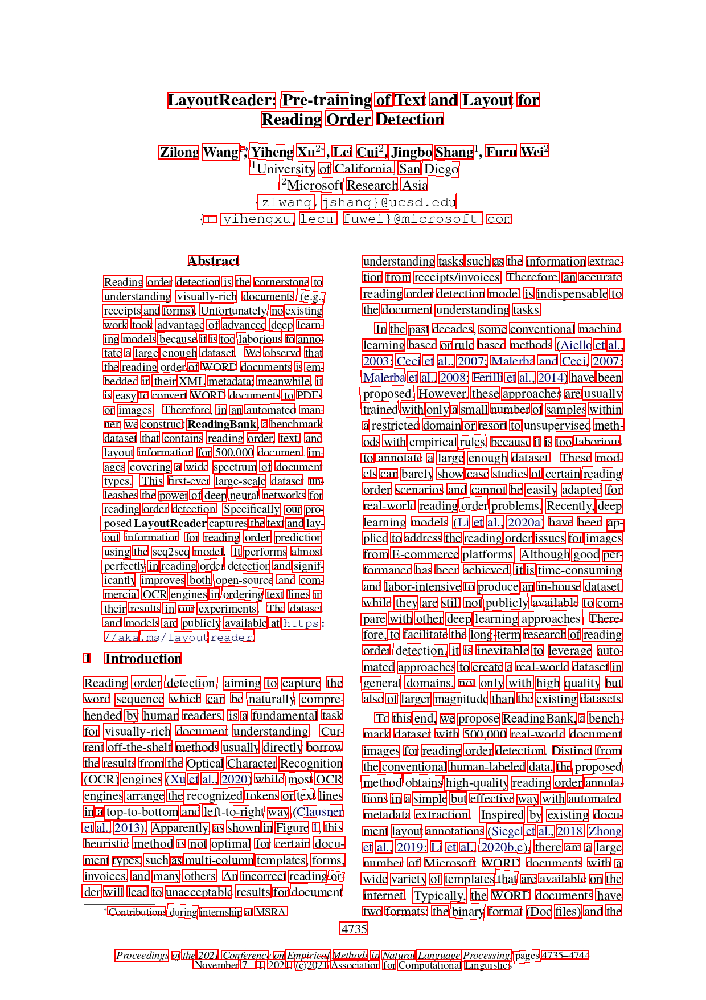

In [ ]:
image = Image.open(image_paths[i])
draw = ImageDraw.Draw(image)
width, height = image.size
ratio = max(width, height)

# words2[:, :, 0] *= width
# words2[:, :, 1] *= height
doctr_coord[:, :, 0] *= width
doctr_coord[:, :, 1] *= height
words_dim_rotated = []

for points in doctr_coord:
    remade_array = [(x, y) for x, y in points]
    draw.polygon(remade_array, outline='red', width=2)
    words_dim_rotated.append(points)

display(image)

# ЗБЕРЕГТИ
# img_name = os.path.basename(image_paths[i])
# # makeDir('result_words')
# image_final.save(f'/content/result_words/{img_name}')

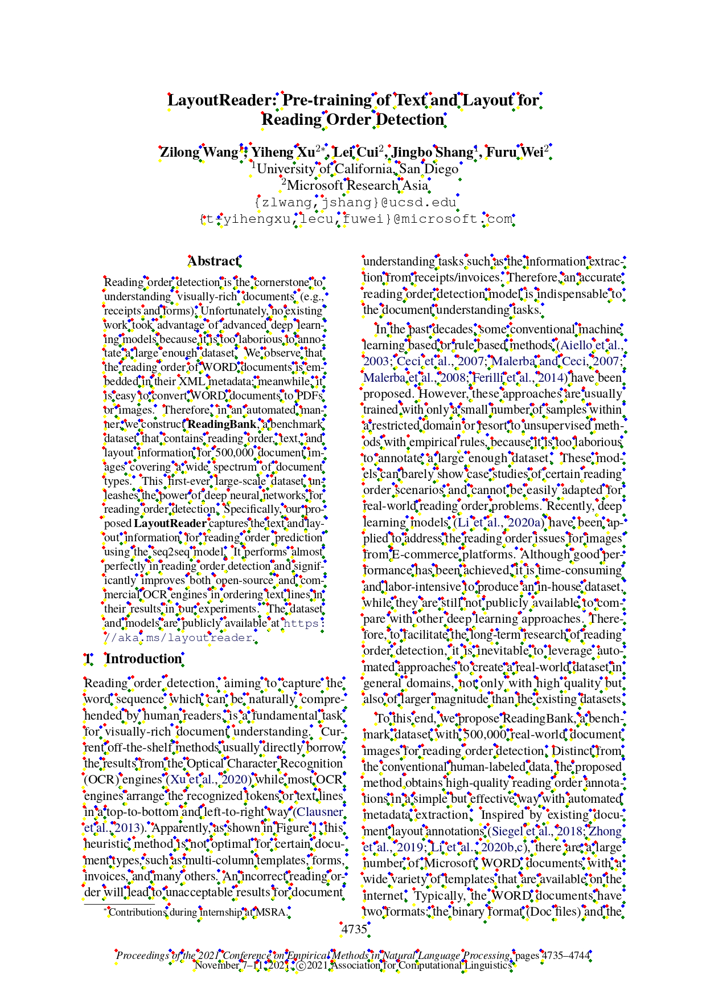

In [ ]:
image_final = Image.open(image_paths[i])
draw = ImageDraw.Draw(image_final)
width, height = image_final.size

ordered_polygons = reorder_coordinates(words_dim_rotated)

for p in ordered_polygons:
  draw.ellipse([(p[0][0],p[0][1]),(p[0][0]+5,p[0][1]+5)], fill="red")
  draw.ellipse([(p[1][0],p[1][1]),(p[1][0]+5,p[1][1]+5)], fill="blue")
  draw.ellipse([(p[2][0],p[2][1]),(p[2][0]+5,p[2][1]+5)],  fill="green")
  draw.ellipse([(p[3][0],p[3][1]),(p[3][0]+5,p[3][1]+5)],  fill="yellow")

# ДЕМОНСТРАЦІЯ ОКРЕМОГО СЛОВА ЧЕРВОНИМ ПРЯМОКУТНИКОМ
# p = ordered_polygons[-5]
# print(p)
# draw.polygon(p, outline='red', width=2)

# ЗБЕРЕГТИ
# img_name = os.path.basename(image_paths[i])
# makeDir('result_dots')
# image_final.save(f'/content/result_dots/{img_name}')


display(image_final)

In [ ]:
ordered_polygons_top = sort_by_y_of_first_coord(ordered_polygons)
# ordered_polygons_top[:9]

In [ ]:
# ordered_polygons_top

In [ ]:
polygons = ordered_polygons_top.copy()
lines = group_words_into_lines(polygons)

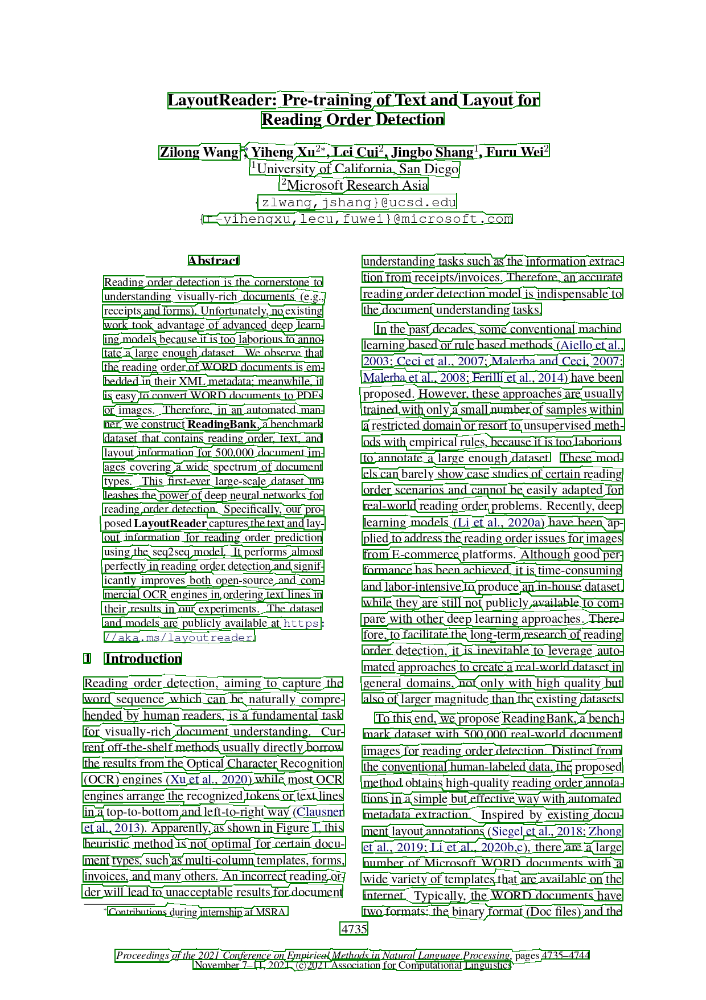

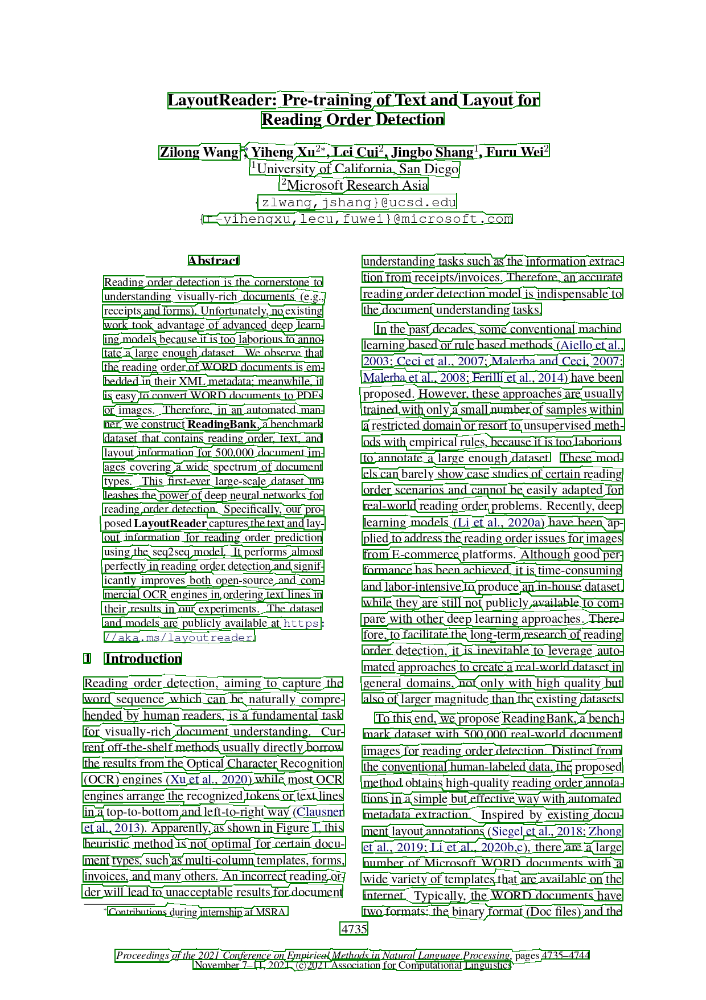

In [ ]:
image_result = Image.open(image_paths[i])
draw_result = ImageDraw.Draw(image_result)

draw_image_lines(lines, draw_result, 'green')
display(image_result)

# text_blocks = []

# for line in lines:
#   append_to_block(line, text_blocks)

# image_result = Image.open(image_paths[i])
# draw_result = ImageDraw.Draw(image_result)

# for b in text_blocks:
#   draw_image_lines(b, draw_result, get_random_color())

display(image_result)

# ЗБЕРЕГТИ
# img_name = os.path.basename(image_paths[i])
# makeDir('result_lines')
# image_final.save(f'/content/result_lines/{img_name}')

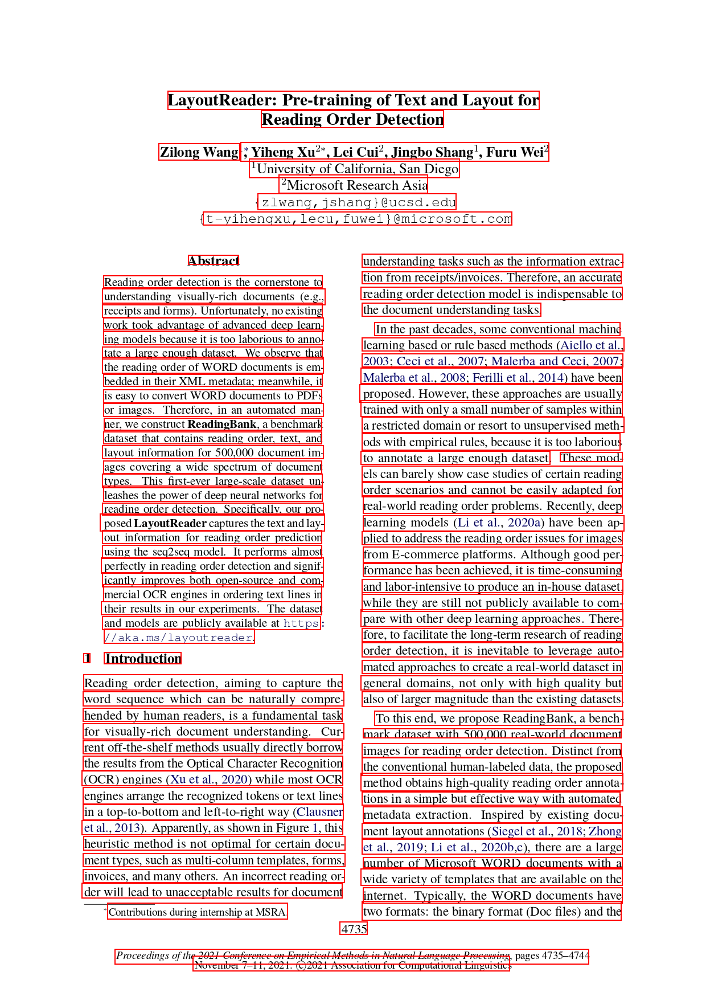

In [ ]:
straight_lines = []
for line in lines:
  highest_y = float('-inf')
  lowest_y = float('inf')
  leftmost_x = float('inf')
  rightmost_x = float('-inf')

  # Iterate over each array of coordinates
  for word in line:
      ys = word[:, 1]
      xs = word[:, 0]
      highest_y = max(highest_y, np.max(ys))
      lowest_y = min(lowest_y, np.min(ys))
      leftmost_x = min(leftmost_x, np.min(xs))
      rightmost_x = max(rightmost_x, np.max(xs))
  c1 = [leftmost_x, lowest_y, rightmost_x, highest_y]
  straight_lines.append(c1)

image = Image.open(image_paths[i])
draw = ImageDraw.Draw(image)

for [x1, y1, x2, y2] in straight_lines:
      draw.rectangle([x1, y1, x2, y2], outline='red', width=2)

display(image)

In [ ]:
boxes =[]
for box in straight_lines:
      boxes.append(normalize_box(box, width, height))
# boxes

In [ ]:
import os
import time
from typing import List

import torch
import uvicorn
from fastapi import FastAPI
from loguru import logger
from pydantic import BaseModel, Field
from transformers import LayoutLMv3ForTokenClassification


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = (
    LayoutLMv3ForTokenClassification.from_pretrained(
        os.getenv("LOAD_PATH", "hantian/layoutreader")
    )
    .bfloat16()
    .to(device)
    .eval()
)
app = FastAPI()


@app.get("/config")
def get_config():
    return {
        "max_len": MAX_LEN,
    }


class PredictRequest(BaseModel):
    boxes: List[List[float]] = Field(
        ...,
        examples=[[[2, 2, 3, 3], [1, 1, 2, 2]]],
        description="Boxes of [left, top, right, bottom]",
    )
    width: float = Field(..., examples=[5], description="Page width")
    height: float = Field(..., examples=[5], description="Page height")


class PredictResponse(BaseModel):
    orders: List[int] = Field(..., examples=[[1, 0]], description="The order of spans.")
    elapsed: float = Field(
        ..., examples=[0.123], description="Elapsed time in seconds."
    )


def do_predict(boxes: List[List[int]]) -> List[int]:
    inputs = boxes2inputs(boxes)
    inputs = prepare_inputs(inputs, model)
    logits = model(**inputs).logits.cpu().squeeze(0)
    return parse_logits(logits, len(boxes))


@app.post("/predict")
def predict(request: PredictRequest) -> PredictResponse:
    x_scale = 1000.0 / request.width
    y_scale = 1000.0 / request.height

    boxes = []
    logger.info(f"Scale: {x_scale}, {y_scale}, Boxes len: {len(request.boxes)}")
    for left, top, right, bottom in request.boxes:
        left = round(left * x_scale)
        top = round(top * y_scale)
        right = round(right * x_scale)
        bottom = round(bottom * y_scale)
        assert (
            1000 >= right >= left >= 0 and 1000 >= bottom >= top >= 0
        ), f"Invalid box. right: {right}, left: {left}, bottom: {bottom}, top: {top}"
        boxes.append([left, top, right, bottom])

    start = time.time()
    orders = do_predict(boxes)
    ret = PredictResponse(orders=orders, elapsed=time.time() - start)
    logger.info(f"Input Length: {len(boxes)}, Predicted in {ret.elapsed:.3f}s.")
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    return ret

In [ ]:
inputs = boxes2inputs(boxes)
inputs = prepare_inputs(inputs, model_l)
logits = model_l(**inputs).logits.cpu().squeeze(0)
orders = parse_logits(logits, len(boxes))
print(orders)

[0, 1, 3, 2, 4, 5, 6, 7, 9, 11, 13, 14, 16, 18, 20, 22, 24, 26, 28, 30, 31, 33, 36, 38, 40, 42, 43, 45, 47, 49, 51, 53, 55, 57, 59, 62, 61, 64, 66, 68, 70, 72, 74, 76, 78, 80, 82, 84, 86, 89, 90, 93, 8, 10, 12, 15, 17, 19, 21, 23, 25, 27, 29, 32, 34, 35, 37, 39, 41, 44, 46, 48, 50, 52, 54, 56, 58, 60, 63, 65, 67, 69, 71, 73, 75, 77, 79, 81, 83, 85, 87, 88, 91, 92, 94, 95, 96]


In [ ]:
from collections import defaultdict
from typing import List, Dict

import torch
from transformers import LayoutLMv3ForTokenClassification

MAX_LEN = 510
CLS_TOKEN_ID = 0
UNK_TOKEN_ID = 3
EOS_TOKEN_ID = 2


class DataCollator:
    def __call__(self, features: List[dict]) -> Dict[str, torch.Tensor]:
        bbox = []
        labels = []
        input_ids = []
        attention_mask = []

        # clip bbox and labels to max length, build input_ids and attention_mask
        for feature in features:
            _bbox = feature["source_boxes"]
            if len(_bbox) > MAX_LEN:
                _bbox = _bbox[:MAX_LEN]
            _labels = feature["target_index"]
            if len(_labels) > MAX_LEN:
                _labels = _labels[:MAX_LEN]
            _input_ids = [UNK_TOKEN_ID] * len(_bbox)
            _attention_mask = [1] * len(_bbox)
            assert len(_bbox) == len(_labels) == len(_input_ids) == len(_attention_mask)
            bbox.append(_bbox)
            labels.append(_labels)
            input_ids.append(_input_ids)
            attention_mask.append(_attention_mask)

        # add CLS and EOS tokens
        for i in range(len(bbox)):
            bbox[i] = [[0, 0, 0, 0]] + bbox[i] + [[0, 0, 0, 0]]
            labels[i] = [-100] + labels[i] + [-100]
            input_ids[i] = [CLS_TOKEN_ID] + input_ids[i] + [EOS_TOKEN_ID]
            attention_mask[i] = [1] + attention_mask[i] + [1]

        # padding to max length
        max_len = max(len(x) for x in bbox)
        for i in range(len(bbox)):
            bbox[i] = bbox[i] + [[0, 0, 0, 0]] * (max_len - len(bbox[i]))
            labels[i] = labels[i] + [-100] * (max_len - len(labels[i]))
            input_ids[i] = input_ids[i] + [EOS_TOKEN_ID] * (max_len - len(input_ids[i]))
            attention_mask[i] = attention_mask[i] + [0] * (
                max_len - len(attention_mask[i])
            )

        ret = {
            "bbox": torch.tensor(bbox),
            "attention_mask": torch.tensor(attention_mask),
            "labels": torch.tensor(labels),
            "input_ids": torch.tensor(input_ids),
        }
        # set label > MAX_LEN to -100, because original labels may be > MAX_LEN
        ret["labels"][ret["labels"] > MAX_LEN] = -100
        # set label > 0 to label-1, because original labels are 1-indexed
        ret["labels"][ret["labels"] > 0] -= 1
        return ret


def boxes2inputs(boxes: List[List[int]]) -> Dict[str, torch.Tensor]:
    bbox = [[0, 0, 0, 0]] + boxes + [[0, 0, 0, 0]]
    input_ids = [CLS_TOKEN_ID] + [UNK_TOKEN_ID] * len(boxes) + [EOS_TOKEN_ID]
    attention_mask = [1] + [1] * len(boxes) + [1]
    return {
        "bbox": torch.tensor([bbox]),
        "attention_mask": torch.tensor([attention_mask]),
        "input_ids": torch.tensor([input_ids]),
    }


def prepare_inputs(
    inputs: Dict[str, torch.Tensor], model: LayoutLMv3ForTokenClassification
) -> Dict[str, torch.Tensor]:
    ret = {}
    for k, v in inputs.items():
        v = v.to(model.device)
        if torch.is_floating_point(v):
            v = v.to(model.dtype)
        ret[k] = v
    return ret


def parse_logits(logits: torch.Tensor, length: int) -> List[int]:
    """
    parse logits to orders

    :param logits: logits from model
    :param length: input length
    :return: orders
    """
    logits = logits[1 : length + 1, :length]
    orders = logits.argsort(descending=False).tolist()
    ret = [o.pop() for o in orders]
    while True:
        order_to_idxes = defaultdict(list)
        for idx, order in enumerate(ret):
            order_to_idxes[order].append(idx)
        # filter idxes len > 1
        order_to_idxes = {k: v for k, v in order_to_idxes.items() if len(v) > 1}
        if not order_to_idxes:
            break
        # filter
        for order, idxes in order_to_idxes.items():
            # find original logits of idxes
            idxes_to_logit = {}
            for idx in idxes:
                idxes_to_logit[idx] = logits[idx, order]
            idxes_to_logit = sorted(
                idxes_to_logit.items(), key=lambda x: x[1], reverse=True
            )
            # keep the highest logit as order, set others to next candidate
            for idx, _ in idxes_to_logit[1:]:
                ret[idx] = orders[idx].pop()

    return ret


def check_duplicate(a: List[int]) -> bool:
    return len(a) != len(set(a))

model_l = LayoutLMv3ForTokenClassification.from_pretrained("hantian/layoutreader")

inputs = boxes2inputs(boxes)
inputs = prepare_inputs(inputs, model_l)
logits = model_l(**inputs).logits.cpu().squeeze(0)
orders = parse_logits(logits, len(boxes))
print(orders)

In [ ]:
from google.colab.patches import cv2_imshow

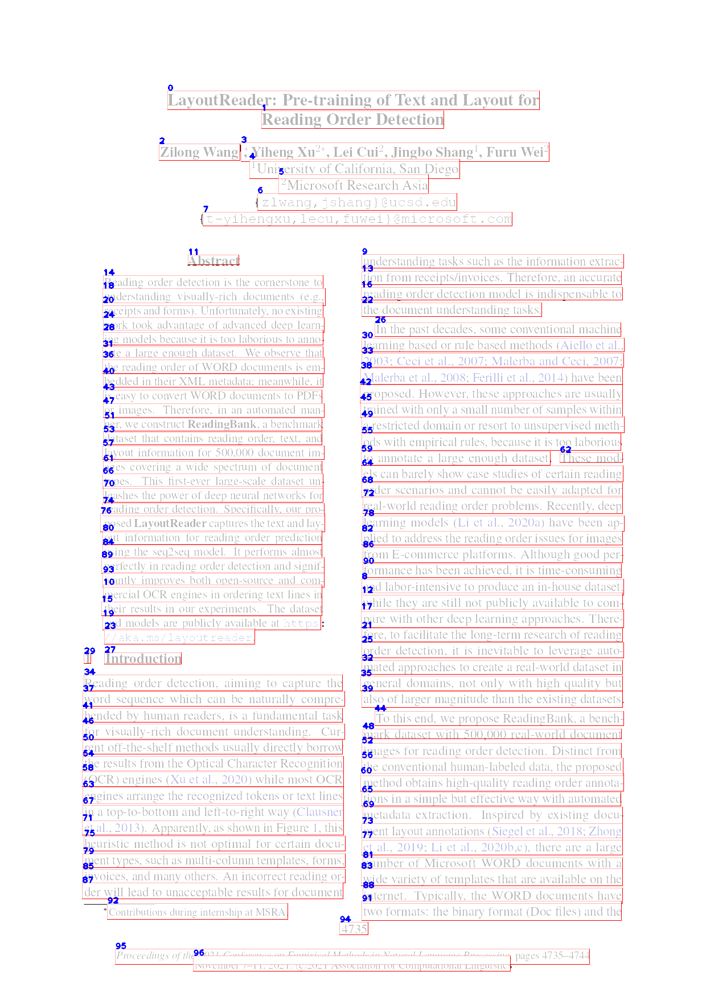

In [ ]:
img = cv2.imread(image_paths[i])

for j, straight_line in enumerate(straight_lines):
        # print(token)
        x1, y1, x2, y2 = straight_line
        x1 = round(x1)
        y1 = round(y1)
        x2 = round(x2)
        y2 = round(y2)
        order = orders[j]
        # cv2.rectangle(img, (x1, y1), (x2, y2), (255, 255, 255), -1)
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 0, 255), 1)

        x, y, w, h = 100, 100, 200, 100
        sub_img = img[y1:y2, x1:x2]
        white_rect = np.ones(sub_img.shape, dtype=np.uint8) * 255
        res = cv2.addWeighted(sub_img, 0.5, white_rect, 0.7, 1.0)
        img[y1:y2, x1:x2] = res

        cv2.putText(
              img,
              str(order),
              (x1, y1),
              cv2.FONT_HERSHEY_PLAIN,
              1,
              (255, 0, 0),
              2,
          )
cv2_imshow(img)

In [ ]:
from google.colab.patches import cv2_imshow

img = cv2.imread(image_paths[i])
def draw_low_opacity_order(op, img, straight_lines):
  for j, straight_line in enumerate(straight_lines):
        # print(token)
        x1, y1, x2, y2 = straight_line
        x1 = round(x1)
        y1 = round(y1)
        x2 = round(x2)
        y2 = round(y2)
        order = orders[j]
        # cv2.rectangle(img, (x1, y1), (x2, y2), (255, 255, 255), -1)
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 0, 255), 1)

        x, y, w, h = 100, 100, 200, 100
        sub_img = img[y1:y2, x1:x2]
        white_rect = np.ones(sub_img.shape, dtype=np.uint8) * 255
        res = cv2.addWeighted(sub_img, 0.5, white_rect, op, 1.0)
        img[y1:y2, x1:x2] = res

        cv2.putText(
              img,
              str(order),
              (x1, y1),
              cv2.FONT_HERSHEY_PLAIN,
              1,
              (255, 0, 0),
              2,
          )
  cv2_imshow(img)

## main order for multiple

In [ ]:
document = DocumentFile.from_images(image_paths)

In [ ]:
result = model(document)

/usr/local/lib/python3.10/dist-packages/transformers/modeling_utils.py:830: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(


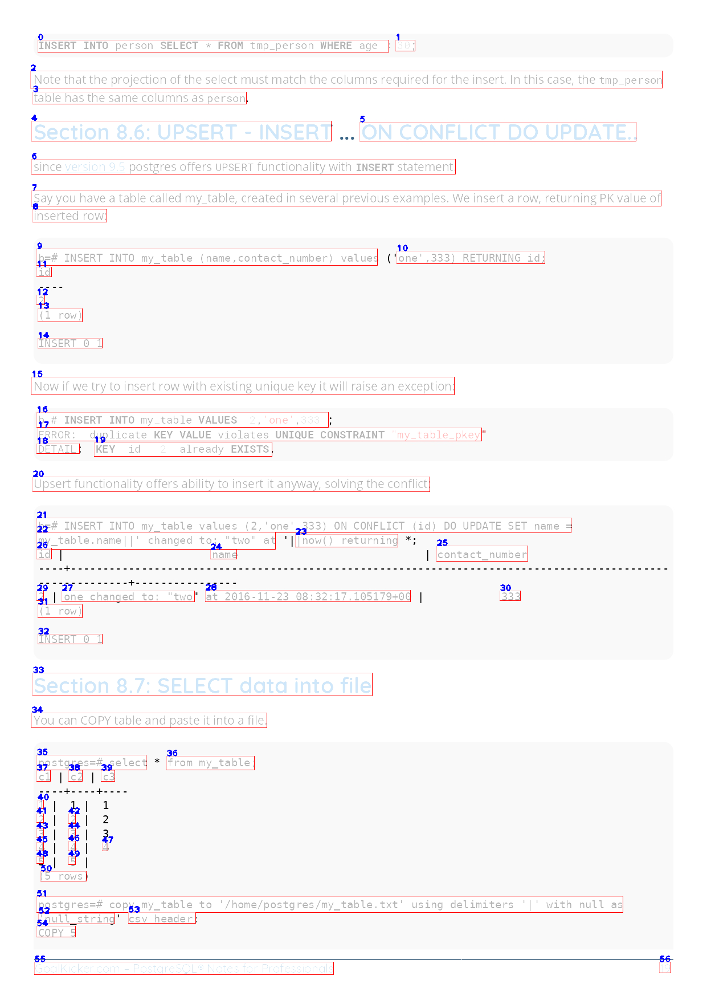

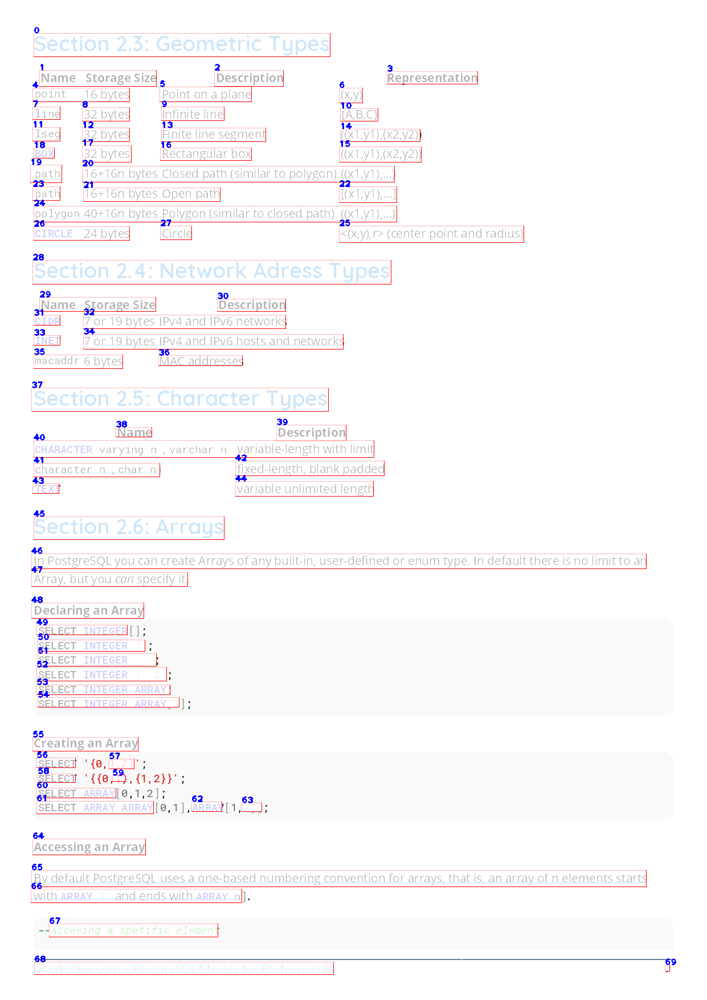

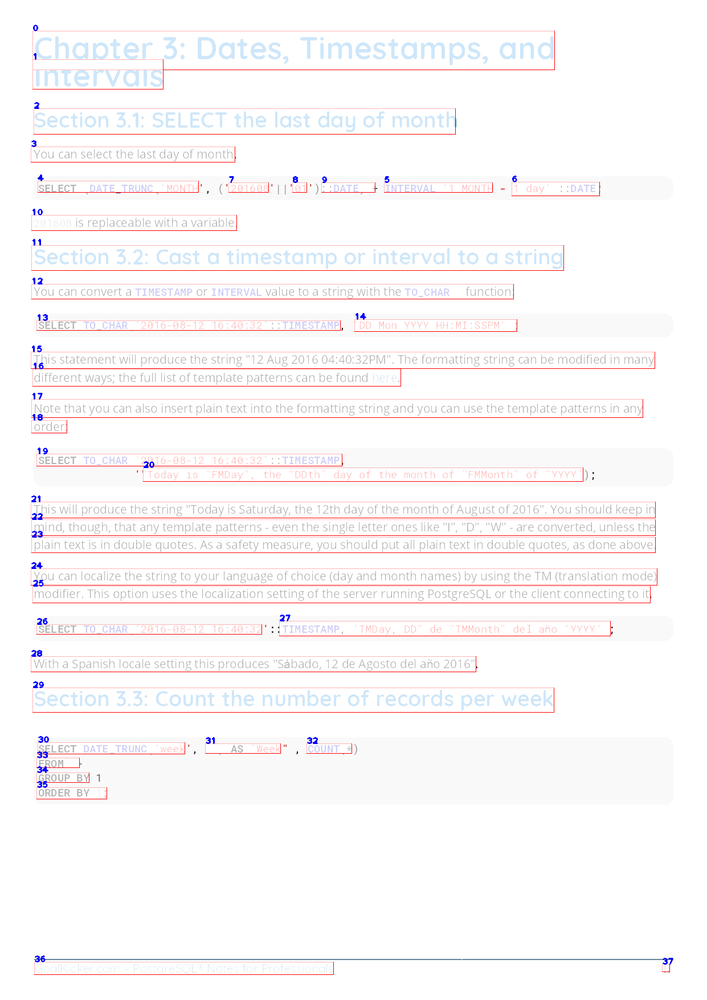

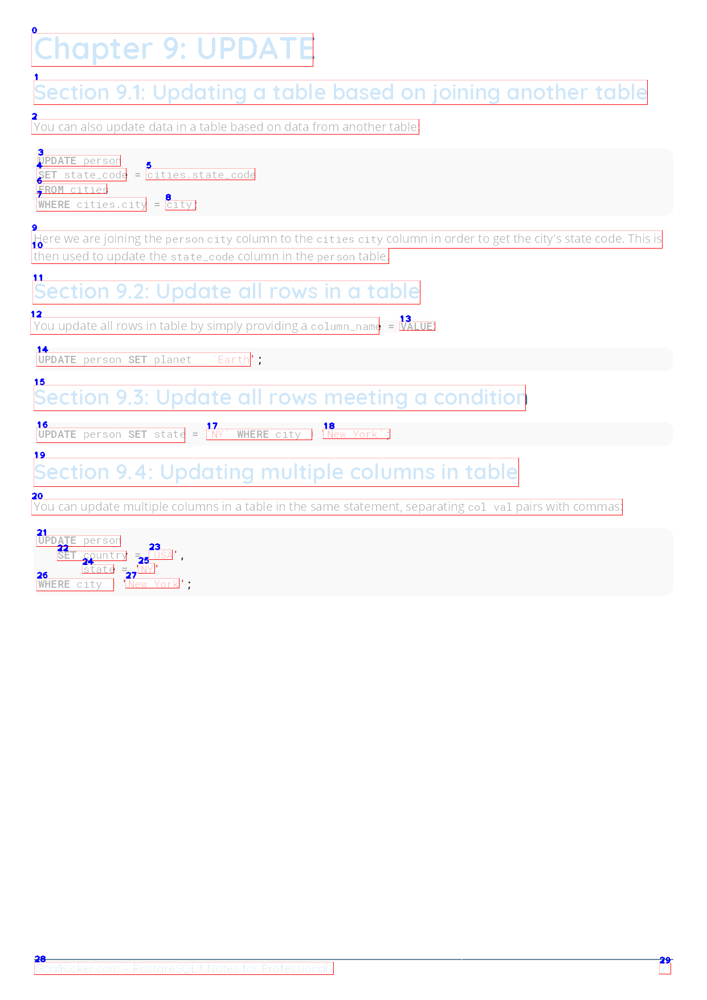

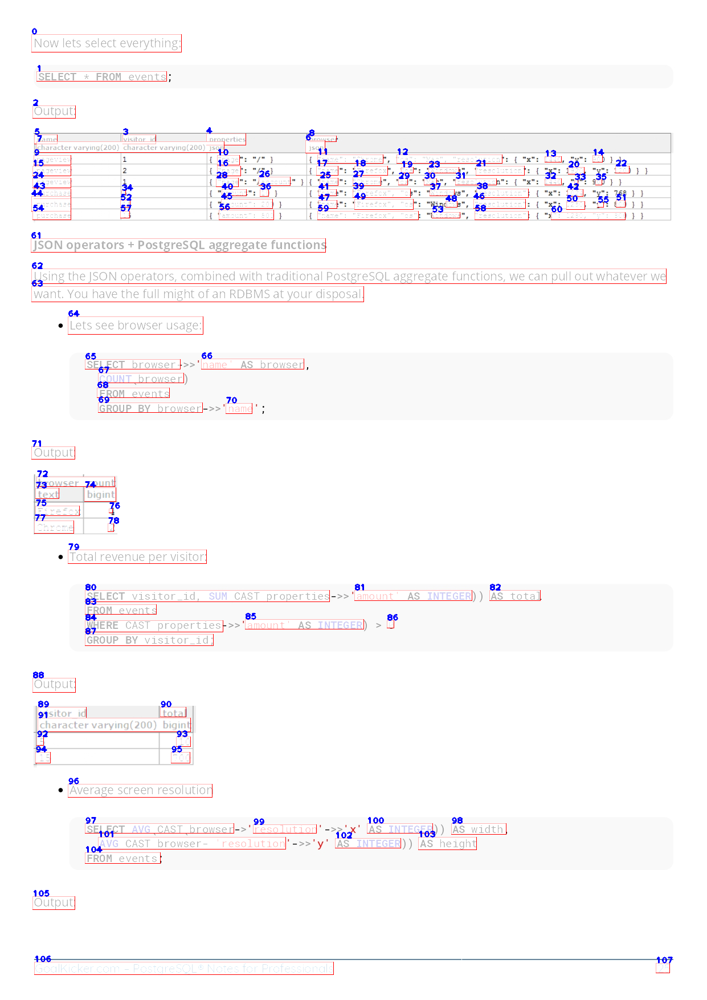

...

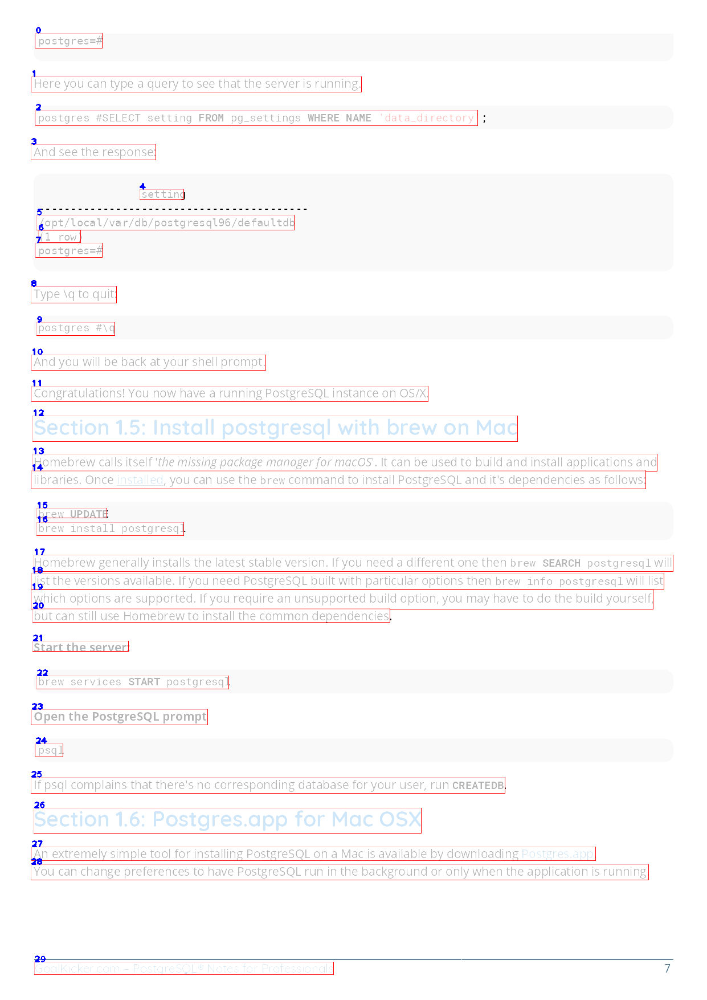

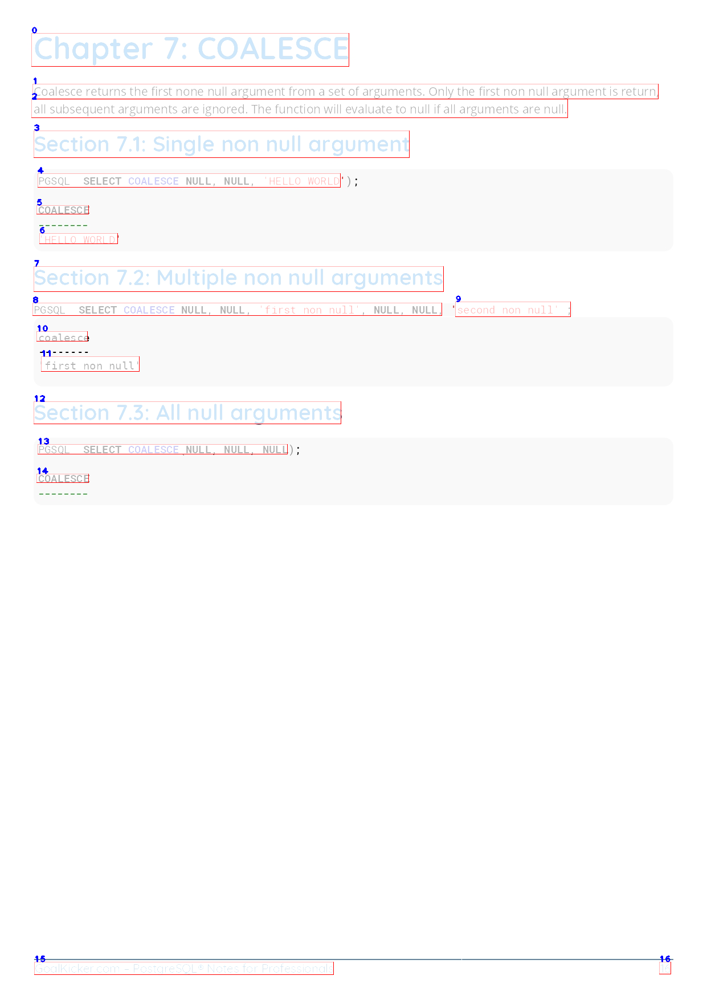

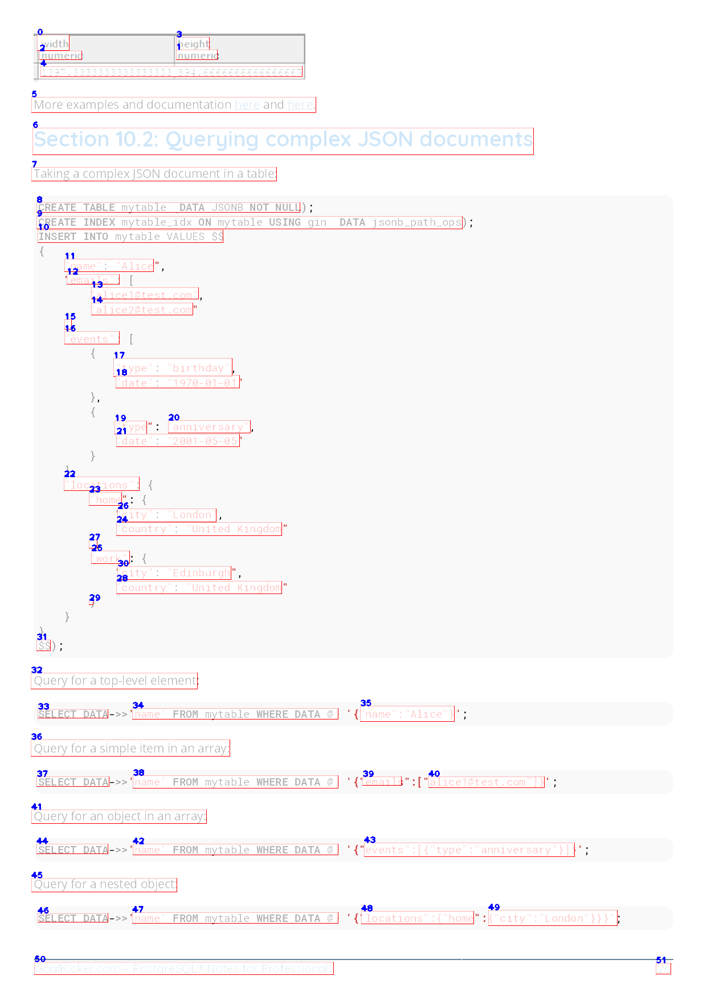

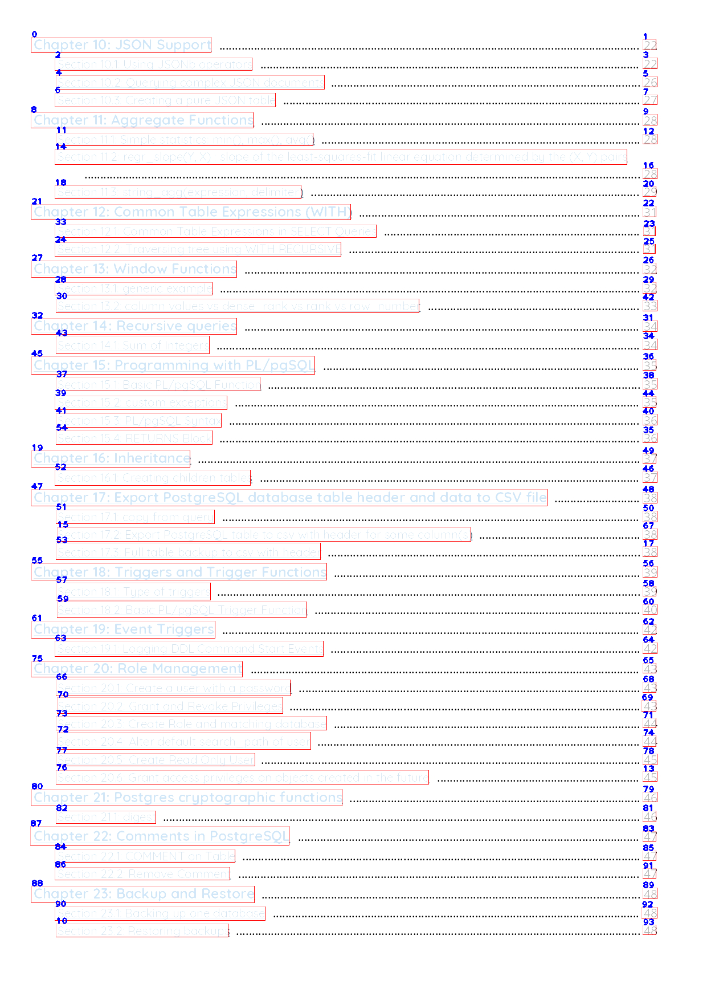

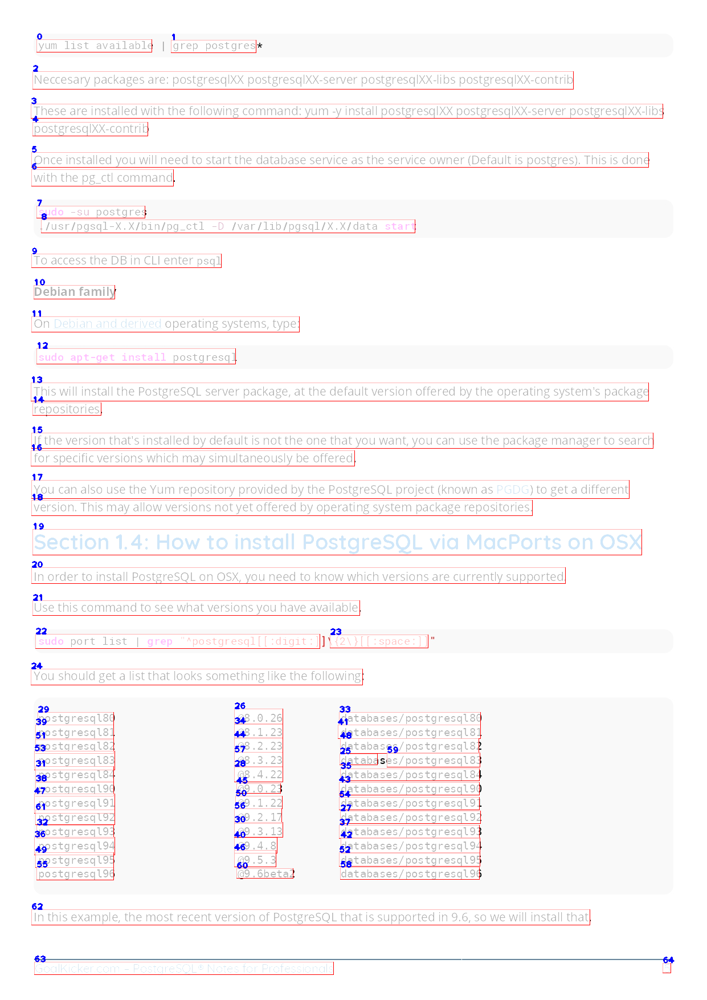

In [ ]:
makeDir('result_full')

for i in range(len(result.pages)):
  image = Image.open(image_paths[i])
  page = result.pages[i]
  blocks = page.blocks
  dims = page.dimensions

  doctr_coord = []

  for b in blocks:
      for line in b.lines:
        for word in line.words:
          coord = word.geometry
          doctr_coord.append(coord)
  doctr_coord = np.array(doctr_coord)
  draw = ImageDraw.Draw(image)

  # words = result[i]['words']
  # wordss = words.copy()

  width, height = image.size
  doctr_coord[:, :, 0] *= width
  doctr_coord[:, :, 1] *= height

  words_dim_rotated = [points for points in doctr_coord]
  ordered_polygons = reorder_coordinates(words_dim_rotated)
  ordered_polygons_top = sort_by_y_of_first_coord(ordered_polygons)

  polygons = ordered_polygons_top.copy()
  lines = group_words_into_lines(polygons)
  # draw_image_lines(lines, draw)

  # text_blocks = []

  # for line in lines:
  #   append_to_block(line, text_blocks)

  # for b in text_blocks:
  #   draw_image_lines(b, draw, get_random_color())
  straight_lines = []
  for line in lines:
    highest_y = float('-inf')
    lowest_y = float('inf')
    leftmost_x = float('inf')
    rightmost_x = float('-inf')

    for word in line:
        ys = word[:, 1]
        xs = word[:, 0]
        highest_y = max(highest_y, np.max(ys))
        lowest_y = min(lowest_y, np.min(ys))
        leftmost_x = min(leftmost_x, np.min(xs))
        rightmost_x = max(rightmost_x, np.max(xs))
    c1 = [leftmost_x, lowest_y, rightmost_x, highest_y]
    straight_lines.append(c1)
  boxes =[]
  for box in straight_lines:
      boxes.append(normalize_box(box, width, height))
  inputs = boxes2inputs(boxes)
  inputs = prepare_inputs(inputs, model_l)
  logits = model_l(**inputs).logits.cpu().squeeze(0)
  orders = parse_logits(logits, len(boxes))

  img = cv2.imread(image_paths[i])
  draw_low_opacity_order(0.7, img, straight_lines)

  # ЗБЕРЕГТИ
  img_name = os.path.basename(image_paths[i])
  cv2.imwrite(f'/content/result_full/{img_name}', img)
  # display(image)

In [ ]:
images_to_pdf('/content/result_full')